# Credit Card Transaction Fraud

# Objective
Credit card frauds basically cause from two types, application and transaction. A fraudster usually try to makes payments as many time as possible in a short time. As a result, with this characteristic, if aggregating transactions over a period of time, we may find some abnormal changes. 

# Dataset
This dataset contains purchases data from June 2013 to July 2014 for programs administered by the state and higher ed institutions. Datasource is from https://data.ok.gov/dataset/purchase-card-pcard-fiscal-year-2014

# Analysis

## Data Overview

In [1]:
import numpy as np
import plotly
import pandas as pd
import plotly
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#loading the data
path = '/Users/Edwina/Desktop/2022fall/5420/week2/'
df = pd.read_csv(path + "purchase_credit_card.csv")

In [3]:
#checking dimensions of the dataset
print(df.columns) #check its column names
print(df.shape) #check its size
print(df.dtypes) #check its data types

Index(['Year-Month', 'Agency Number', 'Agency Name', 'Cardholder Last Name',
       'Cardholder First Initial', 'Description', 'Amount', 'Vendor',
       'Transaction Date', 'Posted Date', 'Merchant Category Code (MCC)'],
      dtype='object')
(442458, 11)
Year-Month                        int64
Agency Number                     int64
Agency Name                      object
Cardholder Last Name             object
Cardholder First Initial         object
Description                      object
Amount                          float64
Vendor                           object
Transaction Date                 object
Posted Date                      object
Merchant Category Code (MCC)     object
dtype: object


The dataset has 442458 rows and 11 coloumns.

In [4]:
#check its summary statistics
df.describe()

,Year-Month,Agency Number,Amount
count,442458.000000,442458.000000,4.424580e+05
mean,201357.284375,42785.860353,4.249912e+02
std,47.107417,33378.461293,5.266509e+03
min,201307.000000,1000.000000,-4.286304e+04
25%,201309.000000,1000.000000,3.091000e+01
50%,201401.000000,47700.000000,1.048900e+02
75%,201404.000000,76000.000000,3.450000e+02
max,201406.000000,98000.000000,1.903858e+06


In [5]:
##check its missing value
df.isnull().sum()

Year-Month                      0
Agency Number                   0
Agency Name                     0
Cardholder Last Name            0
Cardholder First Initial        0
Description                     0
Amount                          0
Vendor                          0
Transaction Date                0
Posted Date                     0
Merchant Category Code (MCC)    0
dtype: int64

There is no missing value in the dataset. 

## Data Cleaning

In [6]:
#change columns name
df.columns = [
    'YM', 'agencyNumber', 'agencyName', 'last', 'first', 'description',
    'amount', 'vendor', 'transactionDate', 'postedDate', 'MCC'
]

In [7]:
#data type and create varibles

#change Year-Month, Transaction Date, and Posted Date from object to datetime
df['YM'] = pd.to_datetime(df['YM'], format = "%Y%m") 
df['transactionDate'] = pd.to_datetime(df['transactionDate'])
df['posteddate'] = pd.to_datetime(df['postedDate'])

#creat year and month fields from Year-Month for future engineering
df['year'] = df['YM'].dt.year
df['month'] = df['YM'].dt.month

#creat week field from Transaction Date
df['week'] = df['transactionDate'].dt.isocalendar().week
dayOfWeek={0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
df['dayOfWeek'] = df['transactionDate'].dt.dayofweek.map(dayOfWeek)

#creat diffOfDays field from Posted Date and Transaction Date
#df['diffOfDays'] = df['postedDate'] - df['transactionDate']

#filter negative value with amount
df = df[df['amount']>=0]

print(df.dtypes)
print(df.shape)

YM                 datetime64[ns]
agencyNumber                int64
agencyName                 object
last                       object
first                      object
description                object
amount                    float64
vendor                     object
transactionDate    datetime64[ns]
postedDate                 object
MCC                        object
posteddate         datetime64[ns]
year                        int64
month                       int64
week                       UInt32
dayOfWeek                  object
dtype: object
(427927, 16)


## EDA

### The Distribution of amount

In [8]:
# Distribution plots of amount
df['amount'].describe()

count    4.279270e+05
mean     4.477477e+02
std      5.350683e+03
min      1.000000e-02
25%      3.590000e+01
50%      1.133400e+02
75%      3.590000e+02
max      1.903858e+06
Name: amount, dtype: float64

In [26]:
# draw box plot inside the violin
fig = px.violin(df, y="amount", box=True, 
                points='all',width=600, height=400)
fig.show()

The Box Plot shows the summary statistics of top DRG. It covers the data from the first quartile to the third quartile.

### The Top 20 Agencies 

In [9]:
# Summarize the count statistics by agency_name in df_count
df_count = df['agencyName'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['agencyName', 'count']

<AxesSubplot:xlabel='count', ylabel='agencyName'>

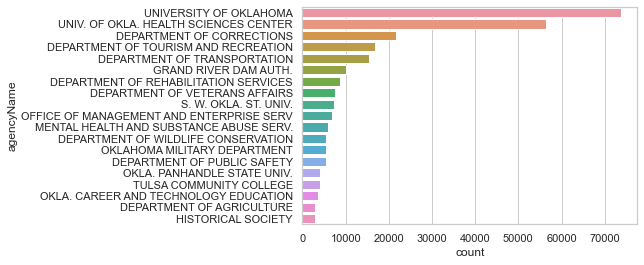

In [19]:
fig = px.bar(df_count,
             x='agencyName',
             y='count',
             color='agencyName',
             width=1000,
             height=400)
sns.set_theme(style="whitegrid")
sns.barplot(y="agencyName", x="count", data=df_count[1:20])

The bar chart display the distribution of agency name. University of Oklahoma and University of Okla. Healthy Sciences center ranked the top two agencies on the frequency of credit card usage. 

### The Distribution of Day of Week

In [10]:
# Summarize the count statistics by dayOfWeek in df_count
df_count = df['dayOfWeek'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['dayOfWeek', 'count']

<AxesSubplot:xlabel='dayOfWeek', ylabel='count'>

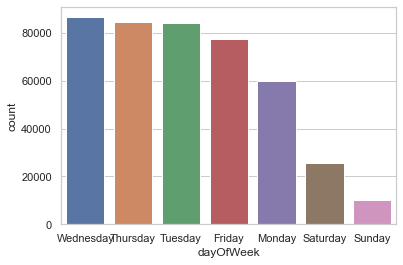

In [11]:
#plot the count 
sns.set_theme(style="whitegrid")
sns.barplot(y="count", x="dayOfWeek", data = df_count)

The bar chart displays Wed, Thu, and Tue are top 3 days of frequency. It implys most employees usually to use card from Tue to Thu. Weekend has less frquency than weekday. 

## Feature Engineering

### Feature 1: The ratio of the amount to average amount spent in each merchant category
This feature is to compare a transaction to the agency's average spending based on merchant category.  It is a good feature to identify anomalies because It will assess the degree of an amount above/below the standard level.

In [38]:
# create average spending group by agency and merchant category
stat_by_agency = df.groupby(['agencyName', 'MCC'])['amount'].mean()
stat_by_agency = pd.DataFrame(stat_by_agency)
stat_by_agency.columns = ['AVGamount']
#stat_by_agency

# add the new feature average spending to the dataset
df1 = pd.merge(df, stat_by_agency, how='left', on=['agencyName', 'MCC'])
# Feature 1: ratio of amount spending and avergae spending by merchant category
df1['agency_merchant_avg_ratio_amount'] = np.where(
    df1['AVGamount'] == 0, 0, df1['amount'] / df1['AVGamount'])
#df1['agency_merchant_avg_ratio_amount'].describe()

# cut by percentile for plotting
var = 'agency_merchant_avg_ratio_amount'
binned_var = var + '_D'
percentile = [0, 0.01, 0.05, 0.2, 0.5, 0.8, 0.95, 0.99, 1]
df1[binned_var] = pd.qcut(df1[var], percentile)
#df1[['agency_merchant_avg_ratio_amount_D']]
df1.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,transactionDate,postedDate,MCC,posteddate,year,month,week,dayOfWeek,AVGamount,agency_merchant_avg_ratio_amount,agency_merchant_avg_ratio_amount_D
0,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Mason,C,GENERAL PURCHASE,890.00,NACAS,2013-07-30,07/31/2013 12:00:00 AM,CHARITABLE AND SOCIAL SERVICE ORGANIZATIONS,2013-07-31,2013,7,31,Tuesday,449.628734,1.979411,"(1.243, 3.378]"
1,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Mason,C,ROOM CHARGES,368.96,SHERATON HOTEL,2013-07-30,07/31/2013 12:00:00 AM,SHERATON,2013-07-31,2013,7,31,Tuesday,470.991494,0.783369,"(0.518, 1.243]"
2,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Massey,J,GENERAL PURCHASE,165.82,SEARS.COM 9300,2013-07-29,07/31/2013 12:00:00 AM,DIRCT MARKETING/DIRCT MARKETERS--NOT ELSEWHERE...,2013-07-31,2013,7,31,Monday,415.132419,0.399439,"(0.149, 0.518]"


[Text(0, 0, '(-0.0009958200000000001, 0.0137]'),
 Text(1, 0, '(0.0137, 0.0432]'),
 Text(2, 0, '(0.0432, 0.149]'),
 Text(3, 0, '(0.149, 0.518]'),
 Text(4, 0, '(0.518, 1.243]'),
 Text(5, 0, '(1.243, 3.378]'),
 Text(6, 0, '(3.378, 8.342]'),
 Text(7, 0, '(8.342, 202.213]')]

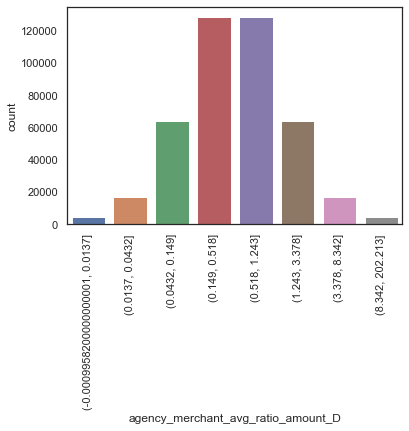

In [39]:
plt.figure(figsize=(6, 4))
g = sns.countplot(x="agency_merchant_avg_ratio_amount_D", data=df1)
g.set_xticklabels(g.get_xticklabels(), rotation=90)

### Feature 2: The ratio of the amount to median amount spent in each merchant category
This feature is to compare a transaction to the agency's median spending based on merchant category.  It is a good feature to identify anomalies because It will assess the degree of an amount above the standard level. We can get an idea of the place of this amount in the distribution of a dataset

In [40]:
# create average spending group by agency and merchant category
stat_by_agency = df.groupby(['agencyName', 'MCC'])['amount'].median()
stat_by_agency = pd.DataFrame(stat_by_agency)
stat_by_agency.columns = ['medianAmount']
#stat_by_agency

# add the new feature average spending to the dataset
df2 = pd.merge(df, stat_by_agency, how='left', on=['agencyName', 'MCC'])
# Feature 1: ratio of amount spending and avergae spending by merchant category
df2['agency_merchant_median_ratio_amount'] = np.where(
    df2['medianAmount'] == 0, 0, df2['amount'] / df2['medianAmount'])
df2['agency_merchant_median_ratio_amount'].describe()

# cut by percentile for plotting
var = 'agency_merchant_median_ratio_amount'
binned_var = var + '_D'
percentile = [0, 0.01, 0.05, 0.2, 0.5, 0.8, 0.95, 0.99, 1]
df2[binned_var] = pd.qcut(df2[var], percentile)
#df2[binned_var]
df2.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,transactionDate,postedDate,MCC,posteddate,year,month,week,dayOfWeek,medianAmount,agency_merchant_median_ratio_amount,agency_merchant_median_ratio_amount_D
0,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Mason,C,GENERAL PURCHASE,890.00,NACAS,2013-07-30,07/31/2013 12:00:00 AM,CHARITABLE AND SOCIAL SERVICE ORGANIZATIONS,2013-07-31,2013,7,31,Tuesday,253.77,3.507113,"(2.63, 8.957]"
1,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Mason,C,ROOM CHARGES,368.96,SHERATON HOTEL,2013-07-30,07/31/2013 12:00:00 AM,SHERATON,2013-07-31,2013,7,31,Tuesday,343.48,1.074182,"(1.0, 2.63]"
2,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Massey,J,GENERAL PURCHASE,165.82,SEARS.COM 9300,2013-07-29,07/31/2013 12:00:00 AM,DIRCT MARKETING/DIRCT MARKETERS--NOT ELSEWHERE...,2013-07-31,2013,7,31,Monday,181.36,0.914314,"(0.395, 1.0]"


[Text(0, 0, '(-0.0009889, 0.0427]'),
 Text(1, 0, '(0.0427, 0.123]'),
 Text(2, 0, '(0.123, 0.395]'),
 Text(3, 0, '(0.395, 1.0]'),
 Text(4, 0, '(1.0, 2.63]'),
 Text(5, 0, '(2.63, 8.957]'),
 Text(6, 0, '(8.957, 26.92]'),
 Text(7, 0, '(26.92, 514556.316]')]

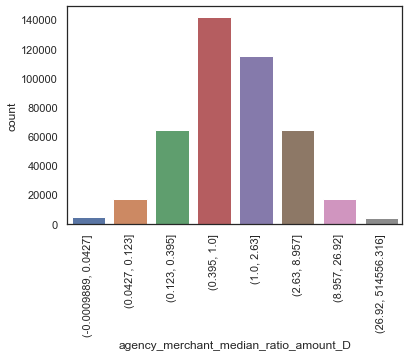

In [41]:
plt.figure(figsize=(6, 4))
g = sns.countplot(x="agency_merchant_median_ratio_amount_D", data=df2)
g.set_xticklabels(g.get_xticklabels(), rotation=90)

### Feature 3: The ratio to the average amount for the past 30 days for each agency
This feature is to compare a transaction to the previous 30-days average amount. It is a good feature to identify anomalies because It will assess the difference between an amount and the average amount of the previous 30 days. The possibility of fraud is high if the amount is higher than a number that has not existed in the last 30 days.

In [42]:
#set index and sort index
df3 = df.set_index('transactionDate')
df3 = df3.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_30d = df3.groupby("agencyName").rolling(
    '30D', closed='both').amount.mean()  #rolling 30 days window
stat_agency_30d = pd.DataFrame(stat_agency_30d)
stat_agency_30d = stat_agency_30d.rename(
    columns={"amount": "Transaction avg 30D"})
stat_agency_30d = stat_agency_30d.groupby([
    'agencyName', 'transactionDate'
]).apply(lambda x: x.max())  #set max values for each date
#stat_agency_30d.head(10)

# add the new feature average spending to the dataset
df3 = pd.merge(df3,
               stat_agency_30d,
               how='left',
               on=['agencyName', 'transactionDate'])
# Feature 1: ratio to average amount for past 30 days for each agency
df3['agency_30d_avg_ratio_amount'] = np.where(
    df3['Transaction avg 30D'] == 0, 0,
    df3['amount'] / df3['Transaction avg 30D'])
df3.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction avg 30D,agency_30d_avg_ratio_amount
transactionDate,,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,15120.00,1.0
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,343148.50,1.0
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,88.94,1.0


In [43]:
plot3 = df3.loc[df3['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.box(plot3,
             y="agency_30d_avg_ratio_amount",
             points="all",
             width=600,
             height=400)
fig.show()

### Feature 4: The ratio to the average amount for the past 7 days for each agency
This feature is to compare a transaction to the previous 7-days average amount. It is a good feature to identify anomalies because It will assess the difference between an amount and the average amount of the previous 7 days. Although the time range is short, the possibility of fraud is still small and needs to be considered if the amount higher than a number that has not existed in last 7 days.

In [44]:
#set index and sort index
df4 = df.set_index('transactionDate')
df4 = df4.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_7d = df4.groupby("agencyName").rolling(
    '7D', closed='both').amount.mean()  #rolling 7 days window
stat_agency_7d = pd.DataFrame(stat_agency_7d)
stat_agency_7d = stat_agency_7d.rename(
    columns={"amount": "Transaction avg 7D"})
stat_agency_7d = stat_agency_7d.groupby([
    'agencyName', 'transactionDate'
]).apply(lambda x: x.max())  #set max values for each date
#df_7d_count.head(10)

# add the new feature average spending to the dataset
df4 = pd.merge(df4,
               stat_agency_7d,
               how='left',
               on=['agencyName', 'transactionDate'])
# Feature 1: ratio to average amount for past 7 days for each agency
df4['agency_7d_avg_ratio_amount'] = np.where(
    df4['Transaction avg 7D'] == 0, 0,
    df4['amount'] / df4['Transaction avg 7D'])
df4.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction avg 7D,agency_7d_avg_ratio_amount
transactionDate,,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,15120.00,1.0
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,343148.50,1.0
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,88.94,1.0


In [45]:
plot4 = df4.loc[df4['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.box(plot4,
             y="agency_7d_avg_ratio_amount",
             points="all",
             width=600,
             height=400)
fig.show()

### Feature 5: The ratio to the average amount for the past 30 days based on each merchant category
This feature shows if each agency’s spending for the past 30 days at the same level on the same merchant type. It is a good feature to identify anomalies because companies regularly purchase a constant amount on the same merchant type. If an amount is higher than the previous 30 days' spending, this may cause fraud. 


In [46]:
#set index and sort index
df5 = df.set_index('transactionDate')
df5 = df5.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_30d_avg = df5.groupby(["agencyName", 'MCC']).rolling(
    '30D', closed='right').amount.mean()  #rolling 30 days window
stat_agency_30d_avg = pd.DataFrame(stat_agency_30d_avg)
stat_agency_30d_avg = stat_agency_30d_avg.rename(
    columns={"amount": "Transaction avg 30D"})
stat_agency_30d_avg = stat_agency_30d_avg.groupby([
    'agencyName', 'MCC', 'transactionDate'
]).apply(lambda x: x.max())  #set max values for each date
stat_agency_30d_avg.head(10)

# add the new feature average spending to the dataset
df5 = pd.merge(df5,
               stat_agency_30d_avg,
               how='left',
               on=['agencyName', 'MCC', 'transactionDate'])
# Feature 1: ratio to average amount for past 30 days for each agency
df5['agency_merchant_avg_ratio_amount30'] = np.where(
    df5['Transaction avg 30D'] == 0, 0,
    df5['amount'] / df5['Transaction avg 30D'])
df5.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction avg 30D,agency_merchant_avg_ratio_amount30
transactionDate,,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,15120.00,1.0
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,343148.50,1.0
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,88.94,1.0


In [47]:
plot5 = df5.loc[df5['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.box(plot5,
             y="agency_merchant_avg_ratio_amount30",
             points="all",
             width=600,
             height=400)
fig.show()

### Feature 9: The ratio to max amount for the past 30 days based on each merchant category
This feature is to compare the amount of each agency’s spending to the max amount for the past 30 days on the same merchant type. Companies regularly purchase the same merchant type, and the possibility of fraud is high if an amount has not existed for the previous 30 days.


In [48]:
#set index and sort index
df9 = df.set_index('transactionDate')
df9 = df9.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_30d_max = df9.groupby(["agencyName", 'MCC']).rolling(
    '30D', closed='right').amount.max()  #rolling 30 days window
stat_agency_30d_max = pd.DataFrame(stat_agency_30d_max)
stat_agency_30d_max = stat_agency_30d_max.rename(
    columns={"amount": "Transaction max 30D"})
stat_agency_30d_max = stat_agency_30d_max.groupby([
    'agencyName', 'MCC', 'transactionDate'
]).apply(lambda x: x.max())  #set max values for each date
stat_agency_30d_max.head(10)

# add the new feature average spending to the dataset
df9 = pd.merge(df9,
               stat_agency_30d_max,
               how='left',
               on=['agencyName', 'MCC', 'transactionDate'])
# Feature 1: ratio to average amount for past 30 days for each agency
df9['agency_merchant_max_ratio_amount30'] = np.where(
    df9['Transaction max 30D'] == 0, 0,
    df9['amount'] / df9['Transaction max 30D'])
df9.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction max 30D,agency_merchant_max_ratio_amount30
transactionDate,,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,15120.00,1.0
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,343148.50,1.0
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,88.94,1.0


In [49]:
plot9 = df9.loc[df9['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.box(plot9,
             y="agency_merchant_max_ratio_amount30",
             points="all",
             width=600,
             height=400)
fig.show()

### Feature 10: The number of transactions for the past 30 days based on each merchant category
This feature shows if the number of each agency’s spending is at the same level on the same merchant type. Companies regularly purchase on the same merchant type, so the number of transactions is constant. If a transaction is only made 1 time, it may commit fraud.


In [50]:
#set index and sort index
df10 = df.set_index('transactionDate')
df10 = df10.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_30d_count = df10.groupby(["agencyName", 'MCC']).rolling(
    '30D', closed='right').amount.count()  #rolling 30 days window
stat_agency_30d_count = pd.DataFrame(stat_agency_30d_count)
stat_agency_30d_count = stat_agency_30d_count.rename(
    columns={"amount": "Transaction count 30D"})
stat_agency_30d_count = stat_agency_30d_count.groupby([
    'agencyName', 'MCC', 'transactionDate'
]).apply(lambda x: x.count())  #set count values for each date
stat_agency_30d_count.head(10)

# add the new feature average spending to the dataset
df10 = pd.merge(df10,
                stat_agency_30d_count,
                how='left',
                on=['agencyName', 'MCC', 'transactionDate'])
df10.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction count 30D
transactionDate,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,1
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,1
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,1


In [51]:
plot10 = df10.loc[
    df10['agencyName'] ==
    'ARDMORE HIGHER EDUCATION CENTER']  #since the dataset is large, i filter out one agency check.
##fig.show()

fig = px.pie(plot10,
             values='Transaction count 30D',
             names='MCC',
             title='The number of transactions exitsed in past 30 days',
             width=600,
             height=400)
fig.layout.update(showlegend=False)
fig.show()

### Feature 7: The average amount on each day of the week for each agency
 
This feature will assess the change in the average amount on each day of the week. People usually purchase goods at a constant level. The possibility of fraud is high if the amounts significantly increase.  It is a good feature to identify anomalies because it is easy to see the change in average spending on each day of week.


In [52]:
#set index and sort index
df7 = df.copy()

# create average amount for each dayOfWeek over weeks
stat_agency_week = df7.groupby(["dayOfWeek", 'week']).amount.mean()
stat_agency_week = pd.DataFrame(stat_agency_week).reset_index()

stat_agency_week.head(3)

,dayOfWeek,week,amount
0,Friday,1,399.478676
1,Friday,2,335.613303
2,Friday,3,593.460536


In [53]:
fig = px.line(stat_agency_week, x='week', y='amount', color='dayOfWeek')
fig.show()

### Feature 8: The number of transactions on each day of the week for each agency
This feature will assess the change in the average amount on each day of the week. The company is likely to spend more amount during weekday not weekend.  As a result, It is a good feature to identify outliers on weekends compared to other periods.


In [54]:
#set index and sort index
df8 = df.copy()

# create
stat_agency_week_count = df7.groupby(["dayOfWeek", 'week']).amount.count()
stat_agency_week_count = pd.DataFrame(stat_agency_week_count).reset_index()

stat_agency_week_count.head(3)

,dayOfWeek,week,amount
0,Friday,1,1148
1,Friday,2,1847
2,Friday,3,1698


In [55]:
fig = px.line(stat_agency_week_count, x='week', y='amount', color='dayOfWeek')
fig.show()

### Feature 6: the average amount spent on the same vendor over the past 30 days
This feature shows if each agency’s spending for the past 30 days is at the same level on the same vendor.
It is a good feature to identify anomalies because it will assess how much an amount is above the standard level. People regularly purchase from the same vendor at a constant amount. If an amount is higher than the previous 30 days' spending, this may cause fraud. 


In [56]:
#set index and sort index
df6 = df.set_index('transactionDate')
df6 = df6.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_vendor_30mean = df6.groupby(["agencyName", 'vendor']).rolling(
    '30D', closed='right').amount.mean()  #rolling 30 days window
stat_agency_vendor_30mean = pd.DataFrame(stat_agency_vendor_30mean)
stat_agency_vendor_30mean = stat_agency_vendor_30mean.rename(
    columns={"amount": "Transaction_vendor_mean30"})
stat_agency_vendor_30mean = stat_agency_vendor_30mean.groupby([
    'agencyName', 'vendor', 'transactionDate'
]).apply(lambda x: x.mean())  #set count values for each date

# add the new feature average spending to the dataset
df6 = pd.merge(df6,
               stat_agency_vendor_30mean,
               how='left',
               on=['agencyName', 'vendor', 'transactionDate'])

df6.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction_vendor_mean30
transactionDate,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,15120.00
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,343148.50
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,88.94


In [57]:
plot6 = df6.loc[df6['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.bar(plot6,
             x='vendor',
             y="Transaction_vendor_mean30",
             width=600,
             height=400)
fig.show()

### Feature 11: the number of transactions spent on the same vendor over the past 30 days
This feature shows if the number of each agency’s spending for the past 30 days is at the same level on the same vendor. It is a good feature to identify anomalies because it will assess whether people purchase from a vendor at the standard level. It is possible to charge multiple times at a store.


In [58]:
#set index and sort index
df11 = df.set_index('transactionDate')
df11 = df11.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_vendor_30count = df11.groupby(["agencyName", 'vendor']).rolling(
    '30D', closed='right').amount.count()  #rolling 30 days window
stat_agency_vendor_30count = pd.DataFrame(stat_agency_vendor_30count)
stat_agency_vendor_30count = stat_agency_vendor_30count.rename(
    columns={"amount": "Transaction_vendor_count30"})
stat_agency_vendor_30count = stat_agency_vendor_30count.groupby([
    'agencyName', 'vendor', 'transactionDate'
]).apply(lambda x: x.count())  #set count values for each date

# add the new feature average spending to the dataset
df11 = pd.merge(df11,
                stat_agency_vendor_30count,
                how='left',
                on=['agencyName', 'vendor', 'transactionDate'])

df11.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction_vendor_count30
transactionDate,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,1
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,1
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,1


In [60]:
plot11 = df11.loc[df11['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.bar(plot11,
             x='vendor',
             y="Transaction_vendor_count30",
             width=600,
             height=400)
fig.show()

### Feature 12: the total amount of transactions spent on the same vendor
It is a good feature to identify anomalies because it helps to show the total spending at each vendor. If a company or a person spent over $50k, the risk of fraud is high.  


In [61]:
#set index and sort index
df12 = df.set_index('transactionDate')
df12 = df12.sort_index()

# create average spending group by agency and 30 days rolling
stat_agency_vendor_30sum = df12.groupby(["agencyName", 'vendor']).rolling(
    '30D', closed='right').amount.sum()  #rolling 30 days window
stat_agency_vendor_30sum = pd.DataFrame(stat_agency_vendor_30sum)
stat_agency_vendor_30sum = stat_agency_vendor_30sum.rename(
    columns={"amount": "Transaction_vendor_sum30"})
stat_agency_vendor_30sum = stat_agency_vendor_30sum.groupby([
    'agencyName', 'vendor', 'transactionDate'
]).apply(lambda x: x.sum())  #set sum values for each date

# add the new feature average spending to the dataset
df12 = pd.merge(df12,
                stat_agency_vendor_30sum,
                how='left',
                on=['agencyName', 'vendor', 'transactionDate'])

df12.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,postedDate,MCC,posteddate,year,month,week,dayOfWeek,Transaction_vendor_sum30
transactionDate,,,,,,,,,,,,,,,,
2013-05-16,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Ropers,A,ROOM CHARGES,15120.00,BETHESDA COURT HOTEL,07/24/2013 12:00:00 AM,"LODGING--HOTELS,MOTELS,AND RESORTS",2013-07-24,2013,7,20,Thursday,15120.00
2013-06-13,2013-07-01,81500,EMPLOYEES BENEFITS DEPARTMENT,81500,8,GENERAL PURCHASE,343148.50,PAYMENT ADJUSTMENT,07/03/2013 12:00:00 AM,OTHER FEES,2013-07-03,2013,7,24,Thursday,343148.50
2013-06-18,2013-07-01,13100,DEPARTMENT OF CORRECTIONS,Gulley,J,GENERAL PURCHASE,88.94,QT 40 01000405,07/02/2013 12:00:00 AM,AUTOMATED FUEL DISPENSER,2013-07-02,2013,7,25,Tuesday,88.94


In [62]:
plot12 = df12.loc[df12['agencyName'] == 'ARDMORE HIGHER EDUCATION CENTER']
fig = px.bar(plot12,
             x='vendor',
             y="Transaction_vendor_sum30",
             width=600,
             height=400)
fig.show()

### Feature 13: the total number of transactions on the same day up to this transaction
This feature shows the total number of transactions for the whole period. It is a good feature to identify anomalies because it could show only one transaction and its vendor. These outliers need to further investigate.


In [63]:
df13 = df.copy()

stat_agency_vendor_30count = df13.groupby(["agencyName",
                                           'vendor']).amount.count()
stat_agency_vendor_30count = pd.DataFrame(stat_agency_vendor_30count)
stat_agency_vendor_30count.columns = ['t_count_vendor']
stat_agency_vendor_30count = stat_agency_vendor_30count.reset_index()

stat_agency_vendor_30count.head(3)

,agencyName,vendor,t_count_vendor
0,ARDMORE HIGHER EDUCATION CENTER,AGRI PRODUCTS,1
1,ARDMORE HIGHER EDUCATION CENTER,CDW GOVERNMENT,4
2,ARDMORE HIGHER EDUCATION CENTER,COUNTY BUILDING CE,1


In [64]:
plot13 = stat_agency_vendor_30count.loc[
    stat_agency_vendor_30count['agencyName'] ==
    'ARDMORE HIGHER EDUCATION CENTER']
fig = px.bar(plot13, x='vendor', y="t_count_vendor", width=600, height=400)
fig.show()

### Feature 14: the total amount spent on the same day up to this transaction
This feature shows the total spending for the whole period. It is a good feature to identify the difference between each vendor and the total spending for each vendor. If people spend too much on one of the vendors, the risk of fraud may be exist.


In [65]:
df14 = df.set_index('transactionDate')
df14 = df14.sort_index()

stat_agency_vendor_30sum = df14.groupby(["agencyName", 'vendor']).amount.sum()
stat_agency_vendor_30sum = pd.DataFrame(stat_agency_vendor_30sum)
stat_agency_vendor_30sum.columns = ['t_sum_vendor']
stat_agency_vendor_30sum = stat_agency_vendor_30sum.reset_index()

stat_agency_vendor_30sum.head(3)

,agencyName,vendor,t_sum_vendor
0,ARDMORE HIGHER EDUCATION CENTER,AGRI PRODUCTS,92.50
1,ARDMORE HIGHER EDUCATION CENTER,CDW GOVERNMENT,1236.63
2,ARDMORE HIGHER EDUCATION CENTER,COUNTY BUILDING CE,58.44


In [66]:
plot14 = stat_agency_vendor_30sum.loc[stat_agency_vendor_30sum['agencyName'] ==
                                      'ARDMORE HIGHER EDUCATION CENTER']
fig = px.bar(plot14, x='vendor', y="t_sum_vendor", width=600, height=400)
fig.show()

### Feature 15: the ratio of the amount to the yearly average spending for each agency
This feature is to assess how many transactions are above the yearly average spending. It is to good identify the degree of the amount to annual average spending.


In [14]:
df15 = df.copy()

stat_agency_year = df15.groupby(["agencyName", 'year']).amount.mean()
stat_agency_year = pd.DataFrame(stat_agency_year)
stat_agency_year.columns = ['t_avg']
stat_agency_year = stat_agency_year.reset_index()

stat_agency_year.head(3)

,agencyName,year,t_avg
0,ARDMORE HIGHER EDUCATION CENTER,2013,149.133600
1,ARDMORE HIGHER EDUCATION CENTER,2014,132.262500
2,ATTORNEY GENERAL,2013,463.080478


In [15]:
# add the new feature average spending to the dataset
df15 = pd.merge(df15, stat_agency_year, how='left', on=['agencyName', 'year'])
# Feature 15: ratio of amount spending and avergae spending by merchant category
df15['agency_avg_ratio_year_amount'] = np.where(df15['t_avg'] == 0, 0,
                                                df15['amount'] / df15['t_avg'])
#df1['agency_merchant_avg_ratio_amount'].describe()

df15.head(3)

,YM,agencyNumber,agencyName,last,first,description,amount,vendor,transactionDate,postedDate,MCC,posteddate,year,month,week,dayOfWeek,t_avg,agency_avg_ratio_year_amount
0,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Mason,C,GENERAL PURCHASE,890.00,NACAS,2013-07-30,07/31/2013 12:00:00 AM,CHARITABLE AND SOCIAL SERVICE ORGANIZATIONS,2013-07-31,2013,7,31,Tuesday,309.353703,2.876966
1,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Mason,C,ROOM CHARGES,368.96,SHERATON HOTEL,2013-07-30,07/31/2013 12:00:00 AM,SHERATON,2013-07-31,2013,7,31,Tuesday,309.353703,1.192680
2,2013-07-01,1000,OKLAHOMA STATE UNIVERSITY,Massey,J,GENERAL PURCHASE,165.82,SEARS.COM 9300,2013-07-29,07/31/2013 12:00:00 AM,DIRCT MARKETING/DIRCT MARKETERS--NOT ELSEWHERE...,2013-07-31,2013,7,31,Monday,309.353703,0.536021


<AxesSubplot:xlabel='year', ylabel='agency_avg_ratio_year_amount'>

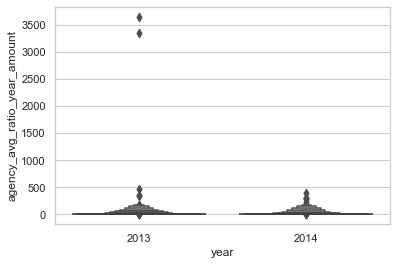

In [20]:
sns.set(style="whitegrid")

sns.boxenplot(x="year",
              y="agency_avg_ratio_year_amount",
              color="b",
              scale="linear",
              data=df15)